In [231]:
import cv2 as cv 
import numpy as np 
import matplotlib.pyplot as plt 

<span style="color:#CCCCCC; font-size:larger; font-weight:bold;">Question 1 - Basic Image Processing</span>



<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;a-</span>


In [232]:
img = cv.imread("balloons.jpg") # Read the image
img = img.astype(np.float32)/255.0 # Normalize the image to the range [0, 1]
print("Image shape:", *img.shape) 

Image shape: 821 1180 3


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;b-</span>


Shape of each channel: 821 1180


(-0.5, 1179.5, 820.5, -0.5)

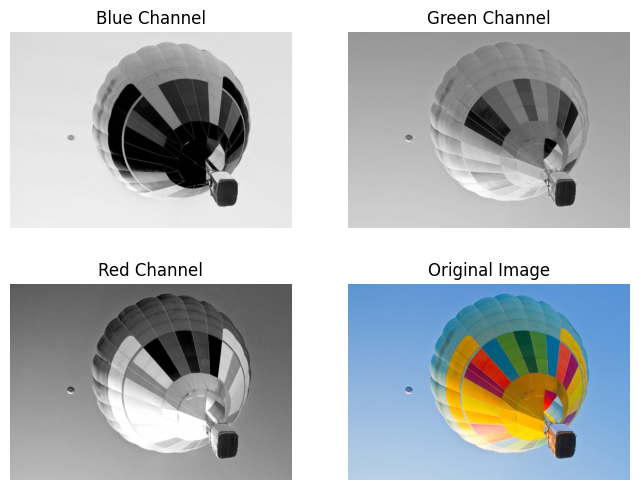

In [233]:
b, g, r = cv.split(img) # Split the image channels 
print("Shape of each channel:", *b.shape) 

plt.figure(figsize=(8, 6)) # Setup a 2x2 grid figure

plt.subplot(2,2,1) # Blue channel 
plt.imshow(b, cmap="gray") 
plt.title("Blue Channel")
plt.axis("off")

plt.subplot(2,2,2) # Green channel 
plt.imshow(g, cmap="gray") 
plt.title("Green Channel")
plt.axis("off")

plt.subplot(2,2,3) # Red channel 
plt.imshow(r, cmap="gray") 
plt.title("Red Channel")
plt.axis("off")

plt.subplot(2,2,4) # Original image 
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)) 
plt.title("Original Image")
plt.axis("off")


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;c-</span>


(-0.5, 1179.5, 820.5, -0.5)

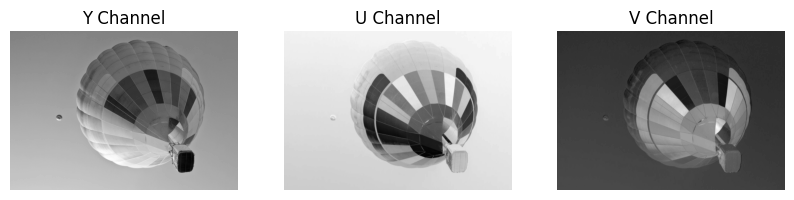

In [234]:
# Refer to class notes for transformations coefficients 
y = 0.299*r + 0.587*g + 0.114*b 
u = -0.147*r - 0.289*g + 0.436*b 
v = 0.615*r - 0.515*g + -0.1*b 

# Create a figure for Y, U, V componenets 

plt.figure(figsize=(10, 8)) # Setup a 2x2 grid figure

plt.subplot(1,3,1) # Y channel 
plt.imshow(y, cmap="gray") 
plt.title("Y Channel")
plt.axis("off")

plt.subplot(1,3,2) # U channel  
plt.imshow(u, cmap="gray") 
plt.title("U Channel")
plt.axis("off")

plt.subplot(1,3,3) # V channel  
plt.imshow(v, cmap="gray") 
plt.title("V Channel")
plt.axis("off") 

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;d-</span>

(-0.5, 1179.5, 820.5, -0.5)

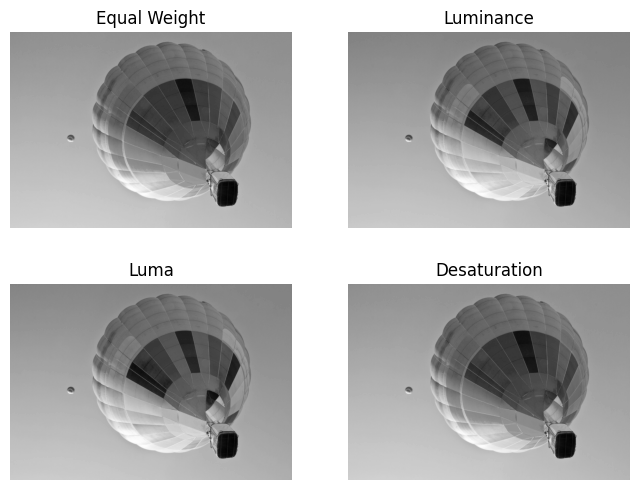

In [235]:
# Equal color intensity 
gray_1 = r/3 + g/3 + b/3 
# Y, the luminance channel. 
gray_2 = y 
# Luma is another method 
gray_3 = 0.2126*r + 0.7152*g + 0.0722*b
# Desaturation 
gray_4 = np.maximum(r,g,b)/2 + np.minimum(r,g,b)/2 

plt.figure(figsize=(8, 6)) # Setup a 2x2 grid figure

plt.subplot(2,2,1) 
plt.imshow(gray_1, cmap="gray") 
plt.title("Equal Weight")
plt.axis("off")

plt.subplot(2,2,2) 
plt.imshow(gray_2, cmap="gray") 
plt.title("Luminance")
plt.axis("off")

plt.subplot(2,2,3) 
plt.imshow(gray_3, cmap="gray") 
plt.title("Luma")
plt.axis("off")

plt.subplot(2,2,4) 
plt.imshow(gray_1, cmap="gray") 
plt.title("Desaturation")
plt.axis("off")



<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;e-</span>

(-0.5, 1179.5, 820.5, -0.5)

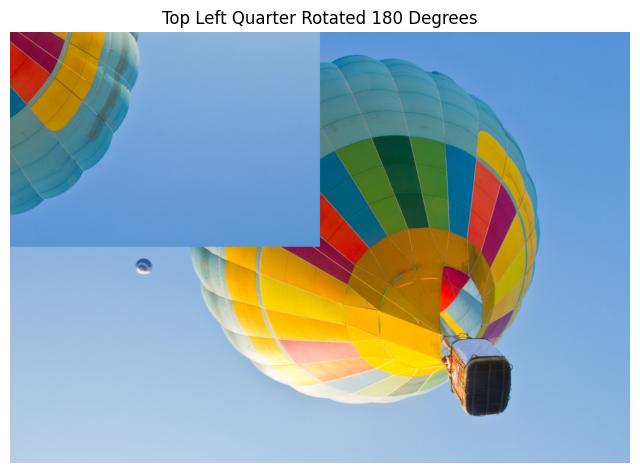

In [236]:
# Rotate the top left quarter of the image by 180 degrees, which is equivalent to mirroring the image wrt. the center of the top left quarter. 
h, w, c = img.shape 
img_rotated = np.array(img, copy=True)

for i in range((h//2)): 
    for j in range((w//2)): 
        for k in range(c): 
            img_rotated[i, j, k] = img[h//2-1-i, w//2-1-j, k]

plt.figure(figsize=(8, 6))

plt.imshow(cv.cvtColor(img_rotated, cv.COLOR_BGR2RGB)) 
plt.title("Top Left Quarter Rotated 180 Degrees")
plt.axis("off")


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;f-</span>

(-0.5, 1179.5, 820.5, -0.5)

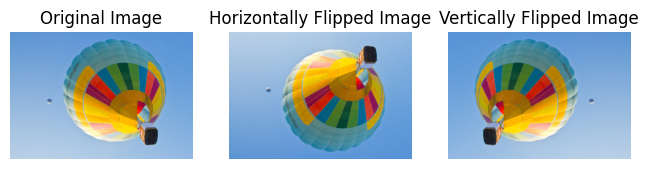

In [237]:
# Flip the image horizontally and vertically. 
h, w, c = img.shape 
img_horizontal_flip = np.array(img, copy=True)
img_vertical_flip = np.array(img, copy=True)

for i in range(h): 
    for j in range(w):
        for k in range(c): 
            img_horizontal_flip[i, j, k] = img[h-i-1, j, k]
            img_vertical_flip[i, j, k] = img[i, w-1-j, k]
            
plt.figure(figsize=(8, 6)) # Setup a 2x2 grid figure

plt.subplot(1,3,1) # Original image 
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)) 
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2) # Horizontally flipped image 
plt.imshow(cv.cvtColor(img_horizontal_flip, cv.COLOR_BGR2RGB)) 
plt.title("Horizontally Flipped Image")
plt.axis("off")

plt.subplot(1,3,3) # Vertically flipped image 
plt.imshow(cv.cvtColor(img_vertical_flip, cv.COLOR_BGR2RGB)) 
plt.title("Vertically Flipped Image")
plt.axis("off")



<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;g-</span>

(-0.5, 1179.5, 820.5, -0.5)

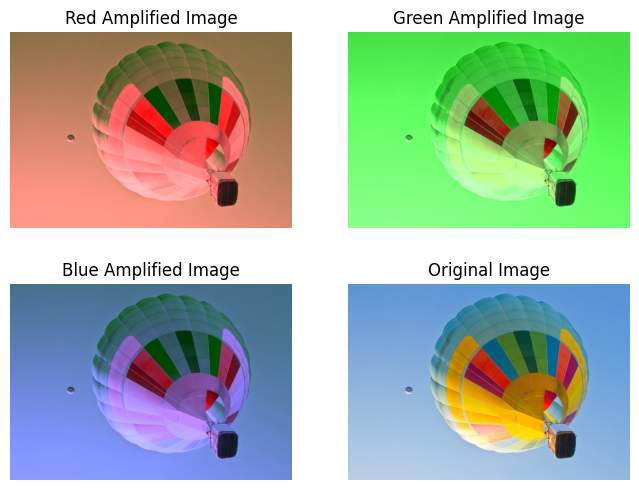

In [238]:
# Define 3 scalars each for a channel. They indicate the relative strength of one channel over the others. When channels are combined this way, it is equivalent to 1x1 convolutions. 
# Amplify red channel. 
c_R = 1.5
c_G = 0.75
c_B = 0.75
img_red_amplified = np.clip(np.stack((c_B*b, c_G*g, c_R*r), axis=-1), 0, 1) 
c_R = 0.75
c_G = 1.5
c_B = 0.75
img_green_amplified = np.clip(np.stack((c_B*b, c_G*g, c_R*r), axis=-1), 0, 1) 
c_R = 0.75
c_G = 0.75
c_B = 1.5
img_blue_amplified = np.clip(np.stack((c_B*b, c_G*g, c_R*r), axis=-1), 0, 1) 

plt.figure(figsize=(8, 6)) # Setup a 2x2 grid figure

plt.subplot(2,2,1)  
plt.imshow(cv.cvtColor(img_red_amplified, cv.COLOR_BGR2RGB)) 
plt.title("Red Amplified Image")
plt.axis("off")

plt.subplot(2,2,2) 
plt.imshow(cv.cvtColor(img_green_amplified, cv.COLOR_BGR2RGB)) 
plt.title("Green Amplified Image")
plt.axis("off")

plt.subplot(2,2,3)  
plt.imshow(cv.cvtColor(img_blue_amplified, cv.COLOR_BGR2RGB)) 
plt.title("Blue Amplified Image")
plt.axis("off")

plt.subplot(2,2,4)  
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)) 
plt.title("Original Image")
plt.axis("off")


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;h-</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;An image can be represented in many different linear reversible transform domains. Hue-Saturation-Lightness(HVS) is one of them. It is shown that the saturation of an image has a strong correlation with its perceptual quality. Therefore, as a custom method, we propose to convert the image from RGB to HSV domain increase the saturation component of it, and converting it back to RGB.</span>

(-0.5, 1179.5, 820.5, -0.5)

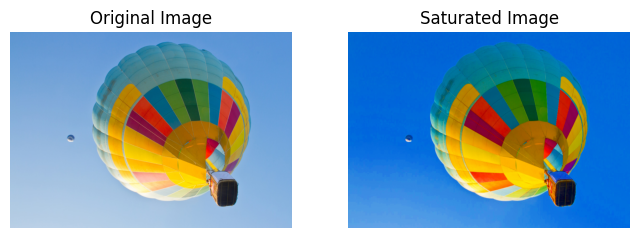

In [239]:
# As a custom color enhancement method, I porpose to increase the saturation of the image as it usually provides a higher quality of experience since the colors get more "vibrant"
# Convert image to HSV base and increase the saturation of the image. 
h, s, v = cv.split(cv.cvtColor(img, cv.COLOR_BGR2HSV)) 
c_S = 3
s = np.clip(c_S*s, 0, 1)
img_saturated = cv.cvtColor(np.stack((h, s, v), axis=-1), cv.COLOR_HSV2BGR)

plt.figure(figsize=(8, 6)) # Setup a 2x2 grid figure

plt.subplot(1,2,1)  
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)) 
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(cv.cvtColor(img_saturated, cv.COLOR_BGR2RGB)) 
plt.title("Saturated Image")
plt.axis("off")

# Image seems more vibrant doesn't it? 


<span style="color:#CCCCCC; font-size:larger; font-weight:bold;">Question 2 - Histogram Equalization and Contrast Enhancement</span>


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;a-</span>

In [240]:
def imageHistogram(img): 
    """ Return the image histogram probability mass function as a 1-D array(s). 

    Args:
        img (numpy.ndarray): Must have entries of type integer [0, 255]
    """
    assert len(img.shape) != 3 or len(img.shape) != 1, "Input image must have the shape (H, W) or (H, W, C)"

    if len(img.shape) == 3: # Color images  
        h, w, c = img.shape 
    else: # Grayscale images 
        h, w = img.shape
        c = 1

    if c==1:
        image_histogram = np.zeros(256)
        for i in range(h): 
            for j in range(w): 
                image_histogram[img[i, j]] += 1 
        return image_histogram/sum(image_histogram) # Normalize the histogram st all entries sum up to 1  
    else: 
        l_image_histograms = []
        for k in range(c): 
            image_histogram = np.zeros(256)
            for i in range(h): 
                for j in range(w): 
                    image_histogram[img[i, j, k]] += 1 
            image_histogram /= sum(image_histogram)
            l_image_histograms.append(image_histogram)
        return l_image_histograms


Text(0, 0.5, 'Probability')

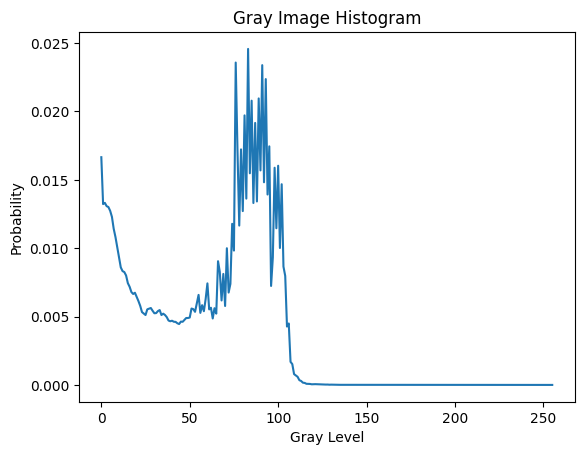

In [241]:
img = cv.imread("q2.jpg")
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY) 
img_gray_hist = imageHistogram(img_gray)

plt.plot(img_gray_hist) 
plt.title("Gray Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

# As the most of the gray levels are concantrated on the left side of the plot, the image is --underexposed--. 


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Observing the histogram plot of the image, we can conclude that the image is underexposed since the gray levels are concentrated in the first half of the gray-level range. As will be shown in the following parts, the image brightness and contrast definitely benefit from histogram stretch.</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;b-</span>

In [242]:
def fullScaleHistogramStretch(img): 
    """ Return histogram-stretched image of range integer [0, 255]

    Args:
        img (np.ndarray): Must have entries of type integer [0, 255]
    """
    img_histograms = imageHistogram(img)
    image_channels = [*cv.split(img)]
    if len(image_channels) == 1:
        edge_threshold = 0.0025 # Ignore small perturbations on histogram edges. 
        img_histogram = img_histograms 
        temp=0 
        for i in range(len(img_histogram)):
            temp += img_histogram[i] 
            if temp > edge_threshold: 
                min_gray_level = i 
                break 
        temp=0 
        for i in range(len(img_histogram)): 
            temp += img_histogram[len(img_histogram)-1-i]
            if temp > 0.01: 
                max_gray_level = len(img_histogram)-1-i  
                break
        img = img.astype(np.float32) / 255.0 # Convert to [0, 1] float range
        min_gray_level /= 255.0 
        max_gray_level /= 255.0  
        img -= min_gray_level # Left shift the histogram 
        img /= (max_gray_level - min_gray_level) # Stretch the histogram to [0, 1] range 
        img = np.clip(img, 0, 1)
        img = np.floor(255*img).astype(np.uint8)
        return img 

    else: 
        pass 



Text(0, 0.5, 'Probability')

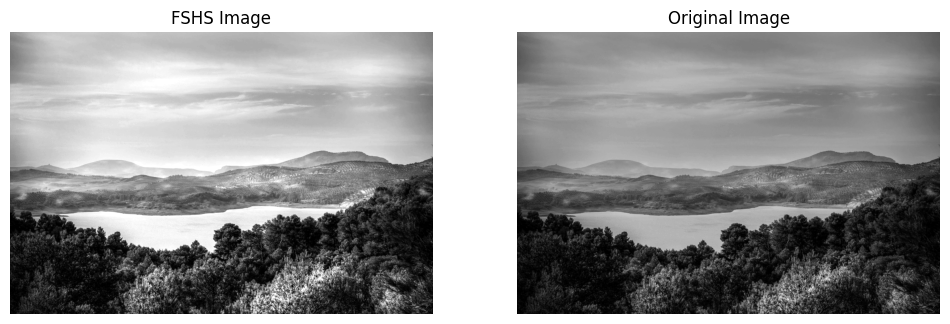

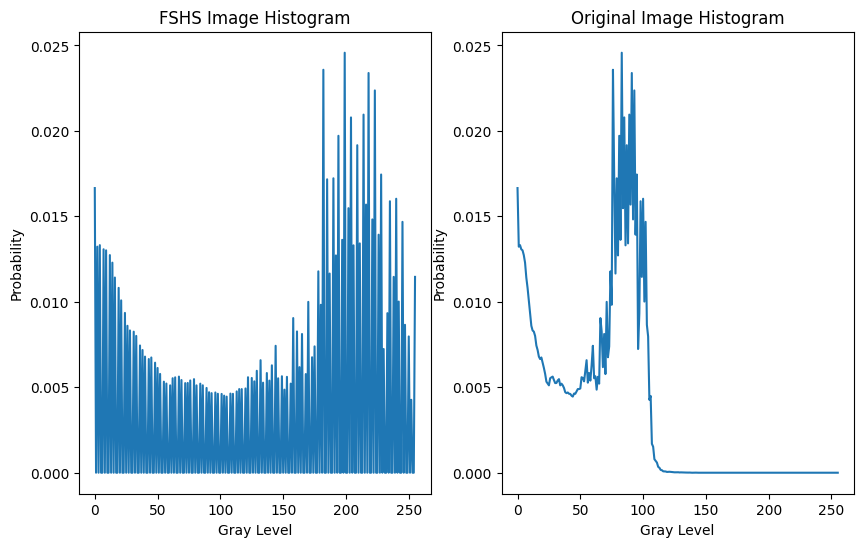

In [243]:
plt.figure(figsize=(12, 10)) 
plt.subplot(1,2,1) 
plt.imshow(img_fshs := fullScaleHistogramStretch(img_gray), cmap="gray") 
plt.title("FSHS Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(img_gray, cmap="gray") 
plt.title("Original Image")
plt.axis("off")

# Compare the original and stretched histograms 
img_histograms = imageHistogram(img_fshs)
plt.figure(figsize=(10, 6)) 
plt.subplot(1,2,1)
plt.plot(img_histograms) 
plt.title("FSHS Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

img_histograms = imageHistogram(img_gray)
plt.subplot(1,2,2)
plt.plot(img_histograms) 
plt.title("Original Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;c-</span>

In [244]:
def logContrastCompression(img):
    assert len(img.shape) != 3 or len(img.shape) != 1, "Input image must have the shape (H, W) or (H, W, C)"

    img_log = img.astype(np.float32) 
    img_log = np.log2(1 + img)
    # Scale the image back to [0, 255] integer range st histogram stretch will be meaningful (If rounding or floor operations are carried out without scaling severe artifacts will be intorduced)
    img_log = img_log / np.log2(255.0)
    img_log *= 255.0 
    img_log = np.round(img_log).astype(np.uint8)

    return img_log   

Text(0, 0.5, 'Probability')

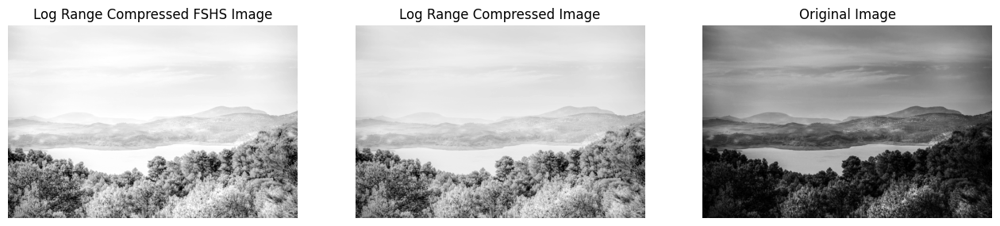

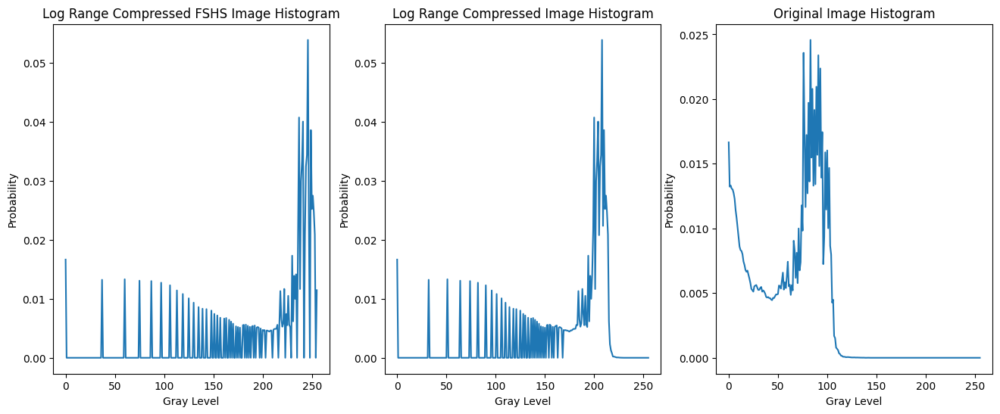

In [245]:
img_log = logContrastCompression(img_gray) 
img_log_fshs = fullScaleHistogramStretch(img_log)

plt.figure(figsize=(16, 16)) 
plt.subplot(1,3,1) 
plt.imshow(img_log_fshs, cmap="gray") 
plt.title("Log Range Compressed FSHS Image")
plt.axis("off")

plt.subplot(1,3,2) 
plt.imshow(img_log, cmap="gray") 
plt.title("Log Range Compressed Image")
plt.axis("off")

plt.subplot(1,3,3) 
plt.imshow(img_gray, cmap="gray") 
plt.title("Original Image")
plt.axis("off")

# Compare the original log-compressed, and log-compressed and stretched histograms 
img_histograms = imageHistogram(img_log_fshs)
plt.figure(figsize=(16, 6)) 
plt.subplot(1,3,1)
plt.plot(img_histograms) 
plt.title("Log Range Compressed FSHS Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

img_histograms = imageHistogram(img_log)
plt.subplot(1,3,2)
plt.plot(img_histograms) 
plt.title("Log Range Compressed Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

img_histograms = imageHistogram(img_gray)
plt.subplot(1,3,3)
plt.plot(img_histograms) 
plt.title("Original Image Histogram")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;d-</span>

In [246]:
def gammaCorrection(img, gamma): 
    img_gamma = img.astype(np.float32)/255.0
    img_gamma = img_gamma ** (1/gamma) 
    img_gamma *= 255.0 
    img_gamma = np.floor(img_gamma).astype(np.uint8)
    return img_gamma 

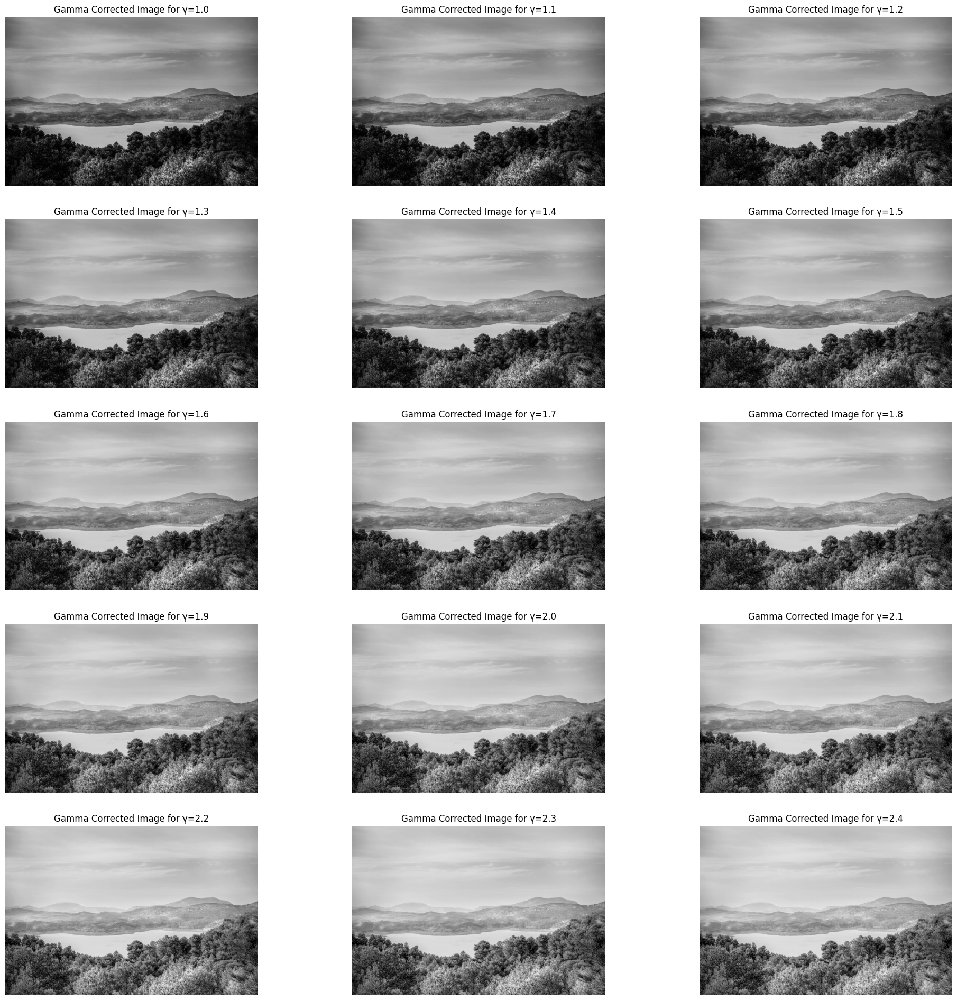

In [247]:
N=15 # Set it divisible by 3 
N=(N//3)*3
low_gamma=1.0 
step_size=0.1
plt.figure(figsize=(24, 24)) 
for i in range(N):
    gamma = low_gamma + step_size*i 
    plt.subplot(N//3, 3,i+1) 
    plt.imshow(gammaCorrection(img_gray, gamma), cmap="gray") 
    plt.title(f"Gamma Corrected Image for \u03B3={gamma:.{2}}")
    plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;e-</span>

(-0.5, 1199.5, 799.5, -0.5)

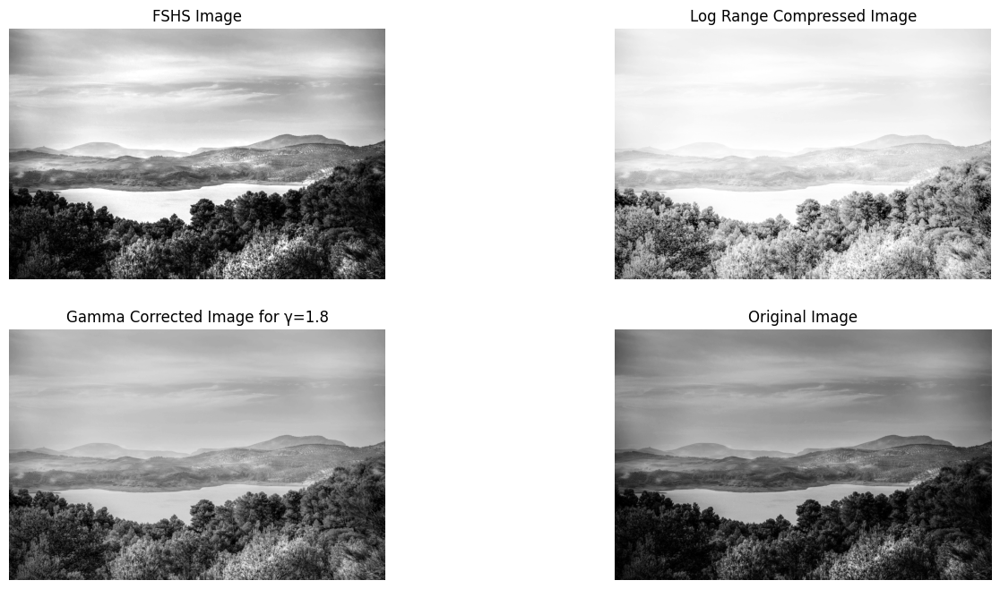

In [248]:
img_gamma = gammaCorrection(img_gray, 1.8) # gamma=1.8 gives the most visually pleasing results as it amplifies univisible details without eroding the visible ones   

plt.figure(figsize=(16, 8)) 
plt.subplot(2,2,1) 
plt.imshow(img_fshs, cmap="gray") 
plt.title("FSHS Image")
plt.axis("off")

plt.subplot(2,2,2) 
plt.imshow(img_log_fshs, cmap="gray") 
plt.title("Log Range Compressed Image")
plt.axis("off")

plt.subplot(2,2,3) 
plt.imshow(img_gamma, cmap="gray") 
plt.title(f"Gamma Corrected Image for \u03B3={1.8:.{2}}")
plt.axis("off")

plt.subplot(2,2,4) 
plt.imshow(img_gray, cmap="gray") 
plt.title("Original Image")
plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Log-range compressed image and gamma-corrected image both amplify the details that are not visible in the original image. FSHS falls short in that regard. Among these 3, gamma correction seems to be the best to me as it preserves visible details; it does not make visible details too bright so that they cannot be perceived.</span>

<span style="color:#CCCCCC; font-size:larger; font-weight:bold;">Question 3 - Binary Image Morphology</span>


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;a-</span>

Text(0, 0.5, 'Probability')

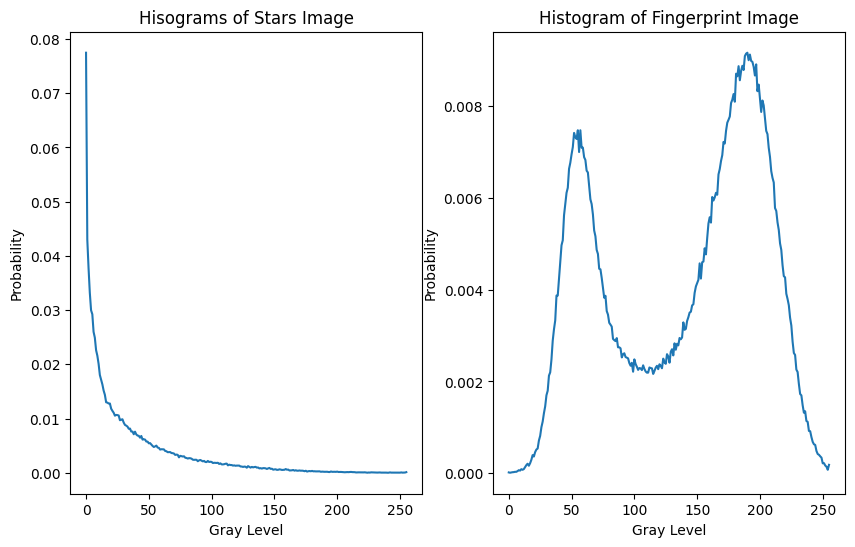

In [249]:
img_stars = cv.cvtColor(cv.imread("stars.jpg"), cv.COLOR_BGR2GRAY)  
img_fingerprint = cv.cvtColor(cv.imread("fingerprint.jpg"), cv.COLOR_BGR2GRAY)  

# Investigate the histrograms of both images to come up with an appropriete threshold value. 
img_histograms = imageHistogram(img_stars) 
plt.figure(figsize=(10, 6)) 
plt.subplot(1,2,1)
plt.plot(img_histograms) 
plt.title("Hisograms of Stars Image")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

img_histograms = imageHistogram(img_fingerprint)
plt.subplot(1,2,2)
plt.plot(img_histograms) 
plt.title("Histogram of Fingerprint Image")
plt.xlabel("Gray Level")
plt.ylabel("Probability")

# Even though it is possible to select a threshold value by eyeballing the image hisgorams, optimal threshold will be highly image dependent. We desire to automize this process. 
# Therefore, we will implement Otsu's method.  

In [250]:
# Otsu's method for binary image thresholding 
def otsuThreshold(img): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 

    # Obtain image PMF  
    img_histogram = imageHistogram(img)
    img_cdf = np.zeros_like(img_histogram)
    # Calculate CDF of the image from its PMF 
    running_sum=0 
    for i in range(len(img_histogram)): 
        running_sum += img_histogram[i]
        img_cdf[i] = running_sum
    
    # Do not add weighted intensities all over again in each iteration. Use a running sum. 
    T=0
    m_0_T_sum=0 
    m_1_T_sum=0 
    for i in range(len(img_histogram)): 
        m_1_T_sum += img_histogram[i]*i 

    max_variance=0 
    for i in range(1, len(img_histogram), 1): 
        p_0_T = img_cdf[i]
        p_1_T = 1 - p_0_T 
        m_0_T_sum += img_histogram[i]*i 
        m_1_T_sum -= img_histogram[i]*i
        m_0_T = m_0_T_sum/p_0_T 
        m_1_T = m_1_T_sum/p_1_T

        interclass_variance = p_0_T*p_1_T*(m_0_T-m_1_T)**2
        if interclass_variance > max_variance: 
            max_variance = interclass_variance 
            T = i 
    return T 

Otsu's threshold for Fingerprint image is: 126/255
Otsu's threshold for Stars image is: 59/255


(-0.5, 599.5, 335.5, -0.5)

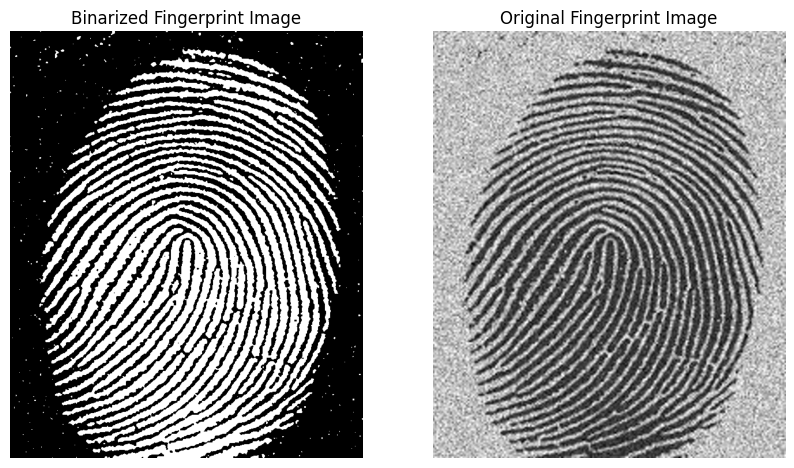

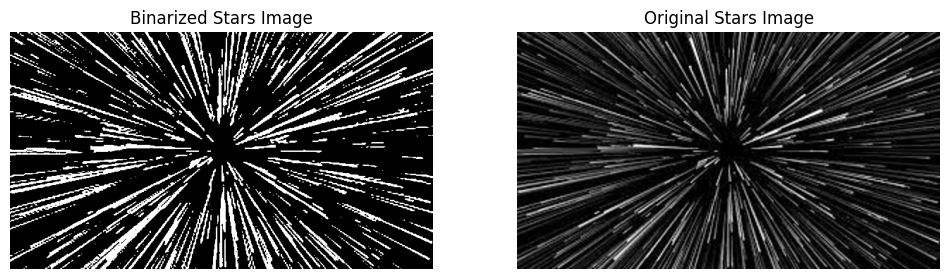

In [251]:
# Obtain thresholds for both images. 
T_fingerprint = otsuThreshold(img_fingerprint) 
T_stars = otsuThreshold(img_stars)

print(f"Otsu's threshold for Fingerprint image is: {T_fingerprint}/255\nOtsu's threshold for Stars image is: {T_stars}/255") 

# Binarize the images. 
img_fingerprint_binarized = (img_fingerprint < T_fingerprint).astype(np.uint8) # For the fingerprint image, the object of interest is black. Hence, the thresholding is applied in the reverse order.    
img_stars_binarized = (img_stars > T_stars).astype(np.uint8)  

plt.figure(figsize=(10, 8)) 
plt.subplot(1,2,1) 
plt.imshow(img_fingerprint_binarized, cmap="gray") 
plt.title("Binarized Fingerprint Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(img_fingerprint, cmap="gray") 
plt.title("Original Fingerprint Image")
plt.axis("off")

plt.figure(figsize=(12, 8)) 
plt.subplot(1,2,1) 
plt.imshow(img_stars_binarized, cmap="gray") 
plt.title("Binarized Stars Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(img_stars, cmap="gray") 
plt.title("Original Stars Image")
plt.axis("off")



<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;I implemented Otsu's method of image threshold selection as it automatically determines the best threshold value assuming that the image consists of a background and an object. Otsu's method finds the threshold that maximizes the intra-variance of each region. For the fingerprint image, I applied the image thresholding in reverse order, where the natural thing to do is to set the pixels below the threshold to 0. The reason for this is that the operations carried out in the following sections, such as erode and dilate, assume that the object is on the high pixels. For the stars, binarization is carried out in the standard way as the object on that image is already whiter.</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;b-</span>

In [252]:
def customDilate(img, window_shape): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 
    assert len(window_shape) == 2, "Window shape must be (W, H)"

    # If the window size is even on a certain axis, we have to discard one sample to keep shape mismatch from happening
    h, w = img.shape
    h_reshaped = h+1 if window_shape[0]%2 == 0 else h 
    w_reshaped = w+1 if window_shape[0]%2 == 0 else w 

    img_padded = np.pad(img, ((window_shape[0]//2, window_shape[0]//2), (window_shape[1]//2, window_shape[1]//2)), "edge") 
    img_windowed = np.lib.stride_tricks.sliding_window_view(img_padded, window_shape).reshape(h_reshaped, w_reshaped, -1)  
    img_dilated = np.any(img_windowed, axis=2).astype(np.uint8)
    
    return img_dilated 

def customErode(img, window_shape): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 
    assert len(window_shape) == 2, "Window shape must be (W, H)"

    # If the window size is even on a certain axis, we have to discard one sample to keep shape mismatch from happening
    h, w = img.shape
    h_reshaped = h+1 if window_shape[0]%2 == 0 else h 
    w_reshaped = w+1 if window_shape[0]%2 == 0 else w 

    img_padded = np.pad(img, ((window_shape[0]//2, window_shape[0]//2), (window_shape[1]//2, window_shape[1]//2)), "edge") 
    img_windowed = np.lib.stride_tricks.sliding_window_view(img_padded, window_shape).reshape(h_reshaped, w_reshaped, -1)  
    img_erode = np.all(img_windowed, axis=2).astype(np.uint8)
    
    return img_erode

(-0.5, 599.5, 335.5, -0.5)

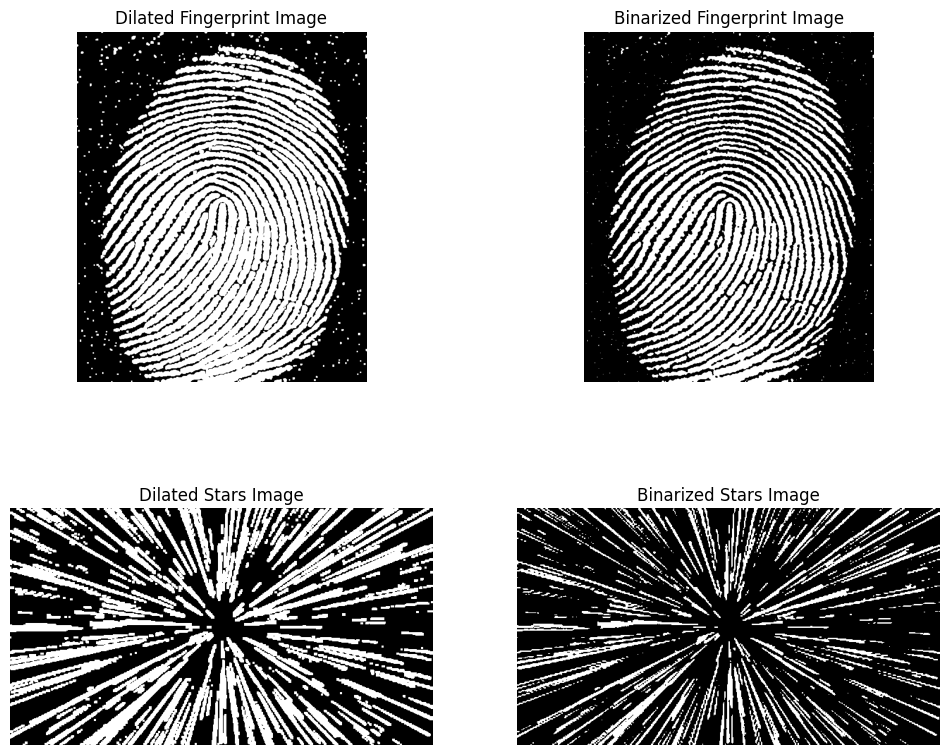

In [253]:
img_fingerprint_binarized_dilated = customDilate(img_fingerprint_binarized, (3, 3)) 
img_stars_binarized_dilated = customDilate(img_stars_binarized, (3, 3)) 

plt.figure(figsize=(12, 10)) 
plt.subplot(2,2,1) 
plt.imshow(img_fingerprint_binarized_dilated, cmap="gray") 
plt.title("Dilated Fingerprint Image")
plt.axis("off")

plt.subplot(2,2,2) 
plt.imshow(img_fingerprint_binarized, cmap="gray") 
plt.title("Binarized Fingerprint Image")
plt.axis("off")

plt.subplot(2,2,3) 
plt.imshow(img_stars_binarized_dilated, cmap="gray") 
plt.title("Dilated Stars Image")
plt.axis("off")

plt.subplot(2,2,4) 
plt.imshow(img_stars_binarized, cmap="gray") 
plt.title("Binarized Stars Image")
plt.axis("off")

(-0.5, 599.5, 335.5, -0.5)

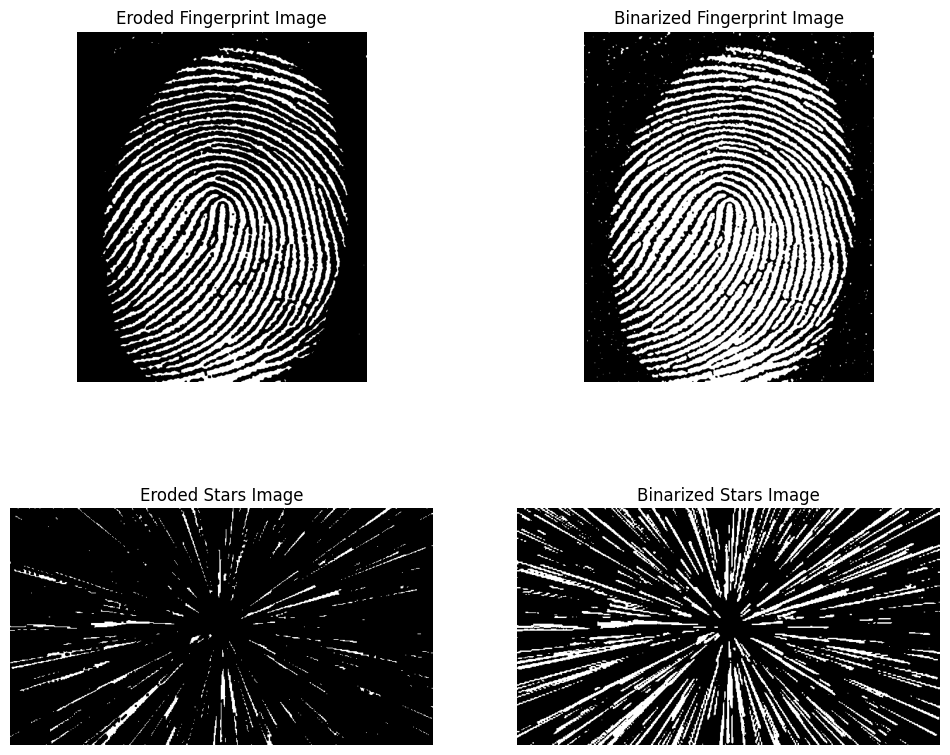

In [254]:
img_fingerprint_binarized_eroded = customErode(img_fingerprint_binarized, (3, 3)) 
img_stars_binarized_eroded = customErode(img_stars_binarized, (3, 3)) 

plt.figure(figsize=(12, 10)) 
plt.subplot(2,2,1) 
plt.imshow(img_fingerprint_binarized_eroded, cmap="gray") 
plt.title("Eroded Fingerprint Image")
plt.axis("off")

plt.subplot(2,2,2) 
plt.imshow(img_fingerprint_binarized, cmap="gray") 
plt.title("Binarized Fingerprint Image")
plt.axis("off")

plt.subplot(2,2,3) 
plt.imshow(img_stars_binarized_eroded, cmap="gray") 
plt.title("Eroded Stars Image")
plt.axis("off")

plt.subplot(2,2,4) 
plt.imshow(img_stars_binarized, cmap="gray") 
plt.title("Binarized Stars Image")
plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;c-</span>

In [255]:
def open(img, window_shape): 
    img_eroded = customErode(img, window_shape)
    img_dilated_eroded = customDilate(img_eroded, window_shape) 

    return img_dilated_eroded 

def close(img, window_shape): 
    img_dilated = customDilate(img, window_shape) 
    img_eroded_dilated = customErode(img_dilated, window_shape)

    return img_eroded_dilated 

def closeOpen(img, window_shape): 
    img_opened = open(img, window_shape) 
    img_closed_opened = close(img_opened, window_shape)

    return img_closed_opened

def openClose(img, window_shape): 
    img_closed = close(img, window_shape)
    img_opened_closed = open(img_closed, window_shape)

    return img_opened_closed  

def medianFilter(img, window_shape): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 
    assert len(window_shape) == 2, "Window shape must be (W, H)"

    # If the window size is even on a certain axis, we have to discard one sample to keep shape mismatch from happening
    h, w = img.shape
    h_reshaped = h+1 if window_shape[0]%2 == 0 else h 
    w_reshaped = w+1 if window_shape[0]%2 == 0 else w 

    img_padded = np.pad(img, ((window_shape[0]//2, window_shape[0]//2), (window_shape[1]//2, window_shape[1]//2)), "edge") 
    img_windowed = np.lib.stride_tricks.sliding_window_view(img_padded, window_shape).reshape(h_reshaped, w_reshaped, -1)  
    img_dilated = np.median(img_windowed, axis=2).astype(np.uint8)
    
    return img_dilated 

(-0.5, 611.5, 740.5, -0.5)

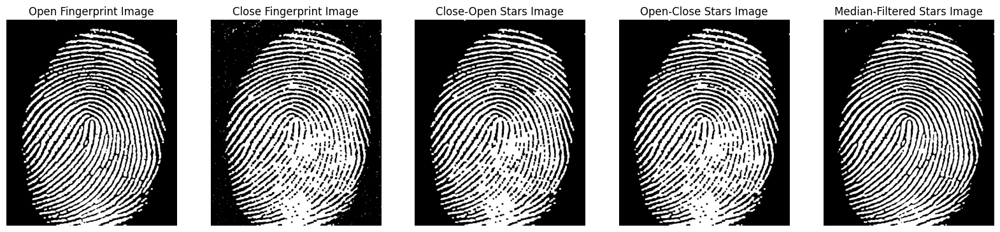

In [256]:
img_fingerprint_binarized_open = open(img_fingerprint_binarized, (5, 5)) 
img_fingerprint_binarized_close = close(img_fingerprint_binarized, (5, 5)) 
img_fingerprint_binarized_close_open = closeOpen(img_fingerprint_binarized, (5, 5)) 
img_fingerprint_binarized_open_close = openClose(img_fingerprint_binarized, (5, 5)) 
img_fingerprint_binarized_median = medianFilter(img_fingerprint_binarized, (5, 5)) 

plt.figure(figsize=(20, 20)) 
plt.subplot(1,5,1) 
plt.imshow(img_fingerprint_binarized_open, cmap="gray") 
plt.title("Open Fingerprint Image")
plt.axis("off")

plt.subplot(1,5,2) 
plt.imshow(img_fingerprint_binarized_close, cmap="gray") 
plt.title("Close Fingerprint Image")
plt.axis("off")

plt.subplot(1,5,3) 
plt.imshow(img_fingerprint_binarized_close_open, cmap="gray") 
plt.title("Close-Open Stars Image")
plt.axis("off")

plt.subplot(1,5,4) 
plt.imshow(img_fingerprint_binarized_open_close, cmap="gray") 
plt.title("Open-Close Stars Image")
plt.axis("off")

plt.subplot(1,5,5) 
plt.imshow(img_fingerprint_binarized_median, cmap="gray") 
plt.title("Median-Filtered Stars Image")
plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;d-</span>

(-0.5, 611.5, 740.5, -0.5)

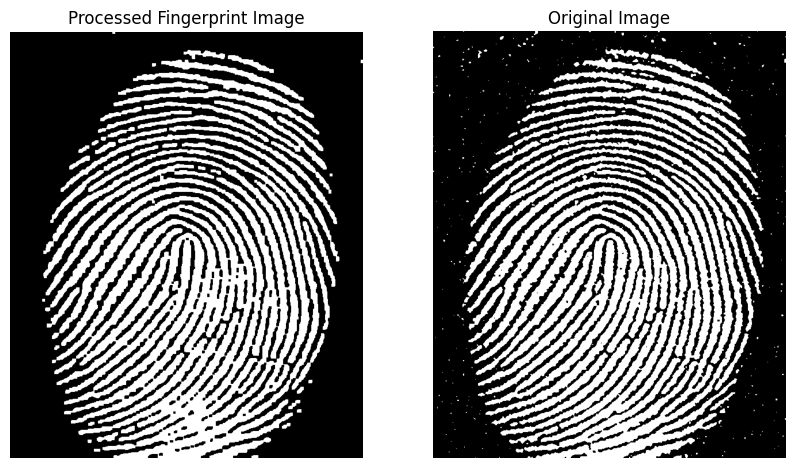

In [257]:
img_fingerprint_binarized_cleaned = open(img_fingerprint_binarized, (5, 5))
img_fingerprint_binarized_cleaned = close(img_fingerprint_binarized_cleaned, (4, 4))

plt.figure(figsize=(10, 10)) 
plt.subplot(1,2,1) 
plt.imshow(img_fingerprint_binarized_cleaned, cmap="gray") 
plt.title("Processed Fingerprint Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(img_fingerprint_binarized, cmap="gray") 
plt.title("Original Image")
plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;e-</span>

In [258]:
def boundaryLength(img): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 
    return np.sum((img > 0).astype(np.uint8) )  

In [259]:
print(f"Total number(ratio) of non-zero pixels in the processed fingerprint image is: {boundaryLength(img_fingerprint_binarized_cleaned)}/{len(img_fingerprint_binarized_cleaned.flatten())} = {boundaryLength(img_fingerprint_binarized_cleaned)/len(img_fingerprint_binarized_cleaned.flatten())}")

Total number(ratio) of non-zero pixels in the processed fingerprint image is: 169484/456202 = 0.371510865800676


<span style="color:#CCCCCC; font-size:larger; font-weight:bold;">Question 4 - Bit-Plane Manipulation</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;a-</span>

In [483]:
def changeBitCount(img, current, target): 
    img_ = img.astype(np.float32) 
    img_ /= (2**current-1) # Dividing by 2**current without subtracting 1 causes loss of information. 
    img_ *= (2**target-1) 
    img_ = np.floor(img_) 
    # Scale back to [0 255] for display purposes. 
    img_ /= (2**target-1) 
    img_ *= 255.0 
    img_ = np.floor(img_).astype(np.uint8) 
    return img_ 

(-0.5, 1184.5, 790.5, -0.5)

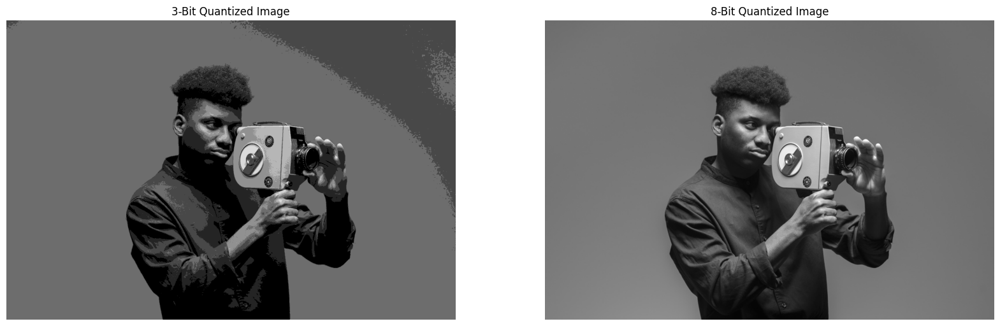

In [484]:
img = cv.imread("q4.jpg") 
img_3bit = changeBitCount(img, 8, 3)   

plt.figure(figsize=(20, 20)) 
plt.subplot(1,2,1) 
plt.imshow(img_3bit) 
plt.title("3-Bit Quantized Image")
plt.axis("off")

plt.subplot(1,2,2) 
plt.imshow(img) 
plt.title("8-Bit Quantized Image")
plt.axis("off")

# The background region consists of pixels of values around 109~110, which is sort of quantization takes a step. 


<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;b-</span>

In [277]:
def imageBitplanes(img): 
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 

    masked_images = [] 
    mask = np.uint8(0b00000001)

    # Obtain each  bit-plane by element-wise masking
    for i in range(8): 
        masked_images.append(np.bitwise_and(img, mask))
        mask = np.left_shift(mask, 1)

    return masked_images


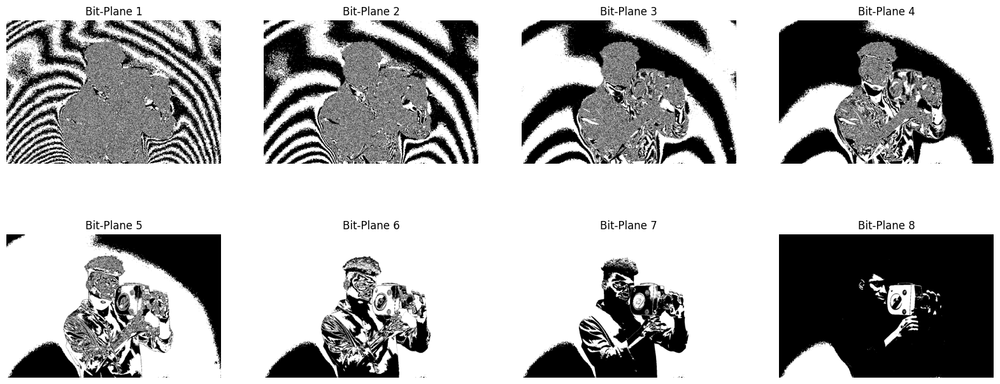

In [292]:
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
masked_images = imageBitplanes(img_gray)
    
# Display each bit-plane 
plt.figure(figsize=(20, 8)) 
for i in range(8): 
    plt.subplot(2,4,i+1)
    plt.imshow(masked_images[i].astype(np.float32)/(2**i), cmap="gray") # Normalize the images to [0, 1] range
    plt.title(f"Bit-Plane {i+1}")
    plt.axis("off")

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;c-</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;We implemented a humble image steganography method. We convert the text to be embedded in the image to a list of ASCII values and then obtain its bitstream. The bitstream is overwritten on one of the image planes with some certain interval. We chose the interval to be 8. Our convention is that we first write the length of the string for 16 bits and write the rest of the bitstream on the flattened bitplane. Bitplane with concealed information is then reshaped back to (H, W) and added together with other bitplanes so that we obtain the image.</span>

In [473]:
def string2Bits(s): 
    # Generate the bitstream of a string. Start with the length of the string. 
    s = [*s]
    s = np.array(list(map(ord, s)), dtype=np.uint8)
    len_s = len(s)
    len_s_left = len_s // (2**8)
    len_s_right = len_s - len_s_left * (2**8)
    s_unpacked = np.zeros(16 + 8*len(s)) 
    s_unpacked[0:8] = np.unpackbits(np.array(len_s_left, dtype=np.uint8))
    s_unpacked[8:16] = np.unpackbits(np.array(len_s_right, dtype=np.uint8))
    s_unpacked[16:] = np.unpackbits(s) 
    return s_unpacked

def embedString2Image(img, s, bitplane_no):
    assert len(img.shape) == 2, "Image must be grayscale; it should be of shape (H, W)" 
    interval = 8 
    h, w = img.shape 
    embeddeble_string_len = h*w // (8 * interval) 
    assert len(s)+interval+bitplane_no < embeddeble_string_len, "String is too long to be embedded in this image"
    
    masked_images = imageBitplanes(img) 
    bitplane = masked_images[bitplane_no]
    bitplane_flat = bitplane.flatten() 
    s_bitstream = string2Bits(s)  
    bitplane_flat[0:len(s_bitstream)*interval:interval] = s_bitstream * (2**bitplane_no)
    bitplane_reconstructed = bitplane_flat.reshape(h, w).copy()

    # Reconstruct the entire image 
    img_reconstructed = sum([masked_images[i] for i in range(len(masked_images)) if i!=bitplane_no ])
    img_reconstructed += bitplane_reconstructed
    
    return img_reconstructed

def decodeStringFromImage(img, bitplane_no): 
    interval = 8 
    # Get the string length 
    masked_images = imageBitplanes(img)
    bitplane = masked_images[bitplane_no]
    bitplane_flat = bitplane.flatten() 

    string_length=0 
    coeff=2**15 
    for i in range(16): 
        string_length += coeff * bitplane_flat[interval*i] // (2**bitplane_no) 
        coeff //= 2  
    
    # Read the string 
    s = "" 
    for i in range(string_length): 
        read_byte=0 
        coeff=128
        for j in range(8): 
            read_byte += coeff * bitplane_flat[2*interval*interval + i*interval*interval+j*interval] // (2**bitplane_no)  
            coeff //= 2 
        read_char = chr(read_byte)
        s = s + read_char 

    return s


Embedded string found in the image is:
I'm walking, my heart ablaze... charred I'm burning!
Love painted me blood red.
Left me neither sane nor mad
Come, see what love did to me

Sometimes as the winds, I whirl
At times as dust on the path, I drift
Sometimes as swift as a flood,
Come, see what Love has done to me

Like the rapids raging for eons,
My worrisome heart scorched and branded
Master's away Im withering
Come, see what Love has done to me

Either grab my hand and lift me
Or guide me to the Union
Make me smile now that I've cried a river
Come, see how Love has done me


(-0.5, 1184.5, 790.5, -0.5)

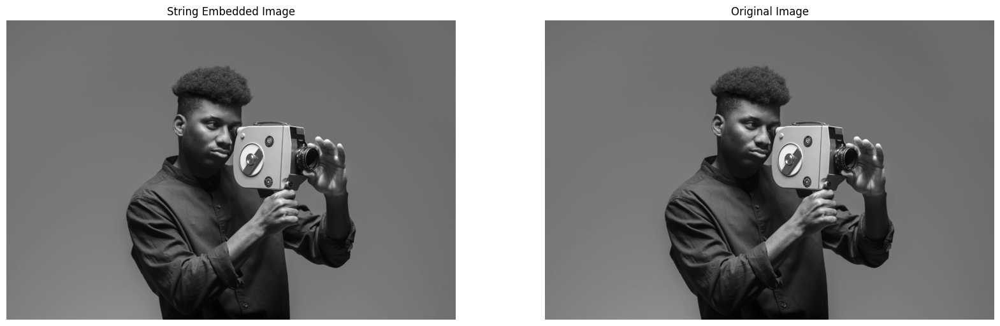

In [475]:
# Maximum string length we can embed is 2^16-1 as we use two bytes for the string length. 
# Embed the string to the cover. A poem by Yunus: 
string_to_be_embedded = "I'm walking, my heart ablaze... charred I'm burning!\nLove painted me blood red.\nLeft me neither sane nor mad\nCome, see what love did to me"
string_to_be_embedded = string_to_be_embedded + "\n\nSometimes as the winds, I whirl\nAt times as dust on the path, I drift\nSometimes as swift as a flood,\nCome, see what Love has done to me" 
string_to_be_embedded = string_to_be_embedded + "\n\nLike the rapids raging for eons,\nMy worrisome heart scorched and branded\nMaster's away I’m withering\nCome, see what Love has done to me"
string_to_be_embedded = string_to_be_embedded +  "\n\nEither grab my hand and lift me\nOr guide me to the Union\nMake me smile now that I've cried a river\nCome, see how Love has done me"

img_string_embedded = embedString2Image(img_gray, string_to_be_embedded, 0) 

# Read the embedded string 
read_string = decodeStringFromImage(img_string_embedded, 0)
print(f"Embedded string found in the image is:\n{read_string}")

plt.figure(figsize=(20, 8)) 
plt.subplot(1,2,1)
plt.imshow(img_string_embedded, cmap="gray") # Normalize the images to [0, 1] range
plt.title("String Embedded Image")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(img_gray, cmap="gray") # Normalize the images to [0, 1] range
plt.title("Original Image")
plt.axis("off")

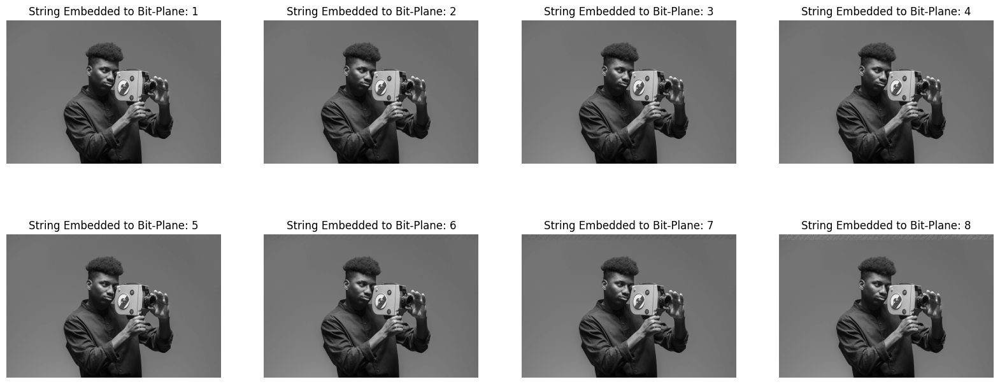

In [480]:
# Experiment with all of the bitplanes to observe the distortions introduced. 

plt.figure(figsize=(20, 8)) 
for i in range(8): 
    img_string_embedded = embedString2Image(img_gray, string_to_be_embedded, i) 
    plt.subplot(2,4,i+1)
    plt.imshow(img_string_embedded, cmap="gray") 
    plt.title(f"String Embedded to Bit-Plane: {i+1}")
    plt.axis("off")

# Observe the top of the image, especially for the one string is embedded to bit-plane 4. The distortion becomes visible. 

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Comparing the images with secret information and heavily 3-bit quantized images, even the most distorted string-embedded image(bit-plane 8) is significantly less distorted than the 3-bit image. Effects of string embedding are not visible up until bit-plane 5. When the string is embedded in bit-plane 8, the noise on top of the image seems similar to moderately severe additive white Gaussian noise. Yet, since those "brush strokes" follow a deterministic pattern, they looks more like intentionally drawn lines instead of a noise pattern that follows a certain statistical trend.</span>

<span style="color:#CCCCCC; font-size:larger; font-weight:bold;">Question 5 - Perceptron in Image Processing</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;a-</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;A perceptron is a computational unit that has a certain number of inputs and a single output. Each input has an associated weight, which is a learnable parameter so that the linear combination of the inputs is calculated. Then, the output is passed through a non-linear function, such as sigmoid or hyperbolic tangent. A perceptron can be thought of as a linear classifier, for which the output can be interpreted as the confidence score. The weights can be learned through the backpropagation algorithm in a data-driven manner. Although a perceptron has a non-linearity, they are only capable of learning simple input-output mappings. This hinders its performance on tasks in which the input and output have a highly complex mathematical relationship. For this reason, especially in the image processing field, perceptrons are combined in a parallel and cascaded manner so that the overall architecture will be capable of learning more complex representations.<br>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;In image processing field, there are various options that perceptron-based architectures can be utilized. The most obvious way is to take the pixel values as the input of the perceptrons. Yet, this approach is usually not feasible, unless image resolution is unrealistically low since the number of weights, therefore memory and time, required to process regular images is huge. Instead, extracting handcrafted features relevant to the task at hand and carrying the learning process over these features is proven to be substantially more efficient. Extracting handcrafted visual features is one of the major endeavors in computer vision literature and we are by no means in the shortage of them.</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;b-</span>

<span style="color:#CCCCCC; font-size:large;">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;For multilayer perceptron architectures, we defined two different approaches. One is feeding the pixel intensities directly, and the other is extracting relevant visual features and inputting them. In either case, one of the most critical parameters is the number of input variables. It will directly affect the structure and complexity of the network. If a handcrafted visual feature-driven approach is selected, the number and type of features is a key component as it directly determines the success or failure of the solution. Types of the non-linear function between each layer are another important parameter. Optimal non-linearity is a task-dependent parameter and most of the time chosen heuristically.<br>&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;Since this is an image classification problem, the output is either ranging from [0, 1] or [-1, 1]. In both cases, it denotes the model's confidence about whether the specified object is present in the image or not. Naturally, it is a single value and therefore, the number of outputs is not a parameter to be chosen. Yet, the loss function the MLP will be trained with respect to should be chosen. The loss function is one of the most critical components of MLPs. For image classification tasks, such as the one we have at hand, cross-entropy loss or its derivatives are widely used.</span>